# 🧠 Hippocampus Volume Analysis - ANTsPyNet HippMapp3r

**Dataset:** OASIS-2 (771 brain MRI scans, 82 patients)  
**Goal:** Track hippocampus volume changes to monitor dementia progression  
**Method:** ANTsPyNet HippMapp3r (state-of-the-art deep learning)

---

## 1️⃣ Install Libraries (Run Once)

In [1]:
# Uncomment to install (only needed once)
# !pip install antspyx antspynet nibabel matplotlib plotly scikit-image pandas numpy scipy

print("✅ Ready to import libraries")

✅ Ready to import libraries


## 2️⃣ Import Libraries

In [3]:
import os
from pathlib import Path
import warnings
warnings.filterwarnings('ignore')

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy import ndimage

import nibabel as nib
import ants
import antspynet

from skimage import measure
import plotly.graph_objects as go

print("✅ All libraries imported!")
print(f"   ANTs: {ants.__version__}")
print(f"   ANTsPyNet: Installed ✓")
print(f"   Nibabel: {nib.__version__}")
print(f"   NumPy: {np.__version__}")
print("\n🎉 Ready to start processing!")

✅ All libraries imported!
   ANTs: 0.6.1
   ANTsPyNet: Installed ✓
   Nibabel: 5.3.2
   NumPy: 1.26.4

🎉 Ready to start processing!


## 3️⃣ Setup Paths

In [6]:
BASE_DIR = Path(r"C:\Users\Ratul\Desktop\cv")
DATA_DIR = BASE_DIR / "raw data" / "Oasis-2" / "part1_extracted" / "OAS2_RAW_PART1"
RESULTS_DIR = BASE_DIR / "results"

SKULL_STRIPPED_DIR = RESULTS_DIR / "skull_stripped"
HIPPOCAMPUS_DIR = RESULTS_DIR / "hippocampus_segmentation"
VOLUMES_DIR = RESULTS_DIR / "volumes"
VIZ_DIR = RESULTS_DIR / "visualizations"

for directory in [SKULL_STRIPPED_DIR, HIPPOCAMPUS_DIR, VOLUMES_DIR, VIZ_DIR]:
    directory.mkdir(parents=True, exist_ok=True)

print(f"✅ Project structure created")
print(f"   Data: {DATA_DIR}")
print(f"   Results: {RESULTS_DIR}")

if not DATA_DIR.exists():
    print(f"\n❌ ERROR: Data directory not found!")
else:
    scan_dirs = list(DATA_DIR.glob("OAS2_*_MR*"))
    print(f"\n📊 Found {len(scan_dirs)} scan directories")

✅ Project structure created
   Data: C:\Users\Ratul\Desktop\cv\raw data\Oasis-2\part1_extracted\OAS2_RAW_PART1
   Results: C:\Users\Ratul\Desktop\cv\results

📊 Found 209 scan directories


## 4️⃣ Find All Scans

In [7]:
def find_all_scans(data_dir):
    scan_info = []
    for scan_dir in sorted(data_dir.glob("OAS2_*_MR*")):
        parts = scan_dir.name.split('_')
        patient_id = parts[1]
        session = int(parts[2][-1])
        
        img_files = list(scan_dir.glob("RAW/*.img"))
        if img_files:
            img_path = img_files[0]
            if img_path.exists() and img_path.with_suffix('.hdr').exists():
                scan_info.append({
                    'patient_id': patient_id,
                    'session': session,
                    'scan_name': scan_dir.name,
                    'img_path': str(img_path)
                })
    return pd.DataFrame(scan_info)

scans_df = find_all_scans(DATA_DIR)
print(f"✅ Found {len(scans_df)} scans")
print(f"   Unique patients: {scans_df['patient_id'].nunique()}")
scans_df.head()

✅ Found 209 scans
   Unique patients: 82


,patient_id,session,scan_name,img_path
0,0001,1,OAS2_0001_MR1,C:\Users\Ratul\Desktop\cv\raw data\Oasis-2\par...
1,0001,2,OAS2_0001_MR2,C:\Users\Ratul\Desktop\cv\raw data\Oasis-2\par...
2,0002,1,OAS2_0002_MR1,C:\Users\Ratul\Desktop\cv\raw data\Oasis-2\par...
3,0002,2,OAS2_0002_MR2,C:\Users\Ratul\Desktop\cv\raw data\Oasis-2\par...
4,0002,3,OAS2_0002_MR3,C:\Users\Ratul\Desktop\cv\raw data\Oasis-2\par...


## 5️⃣ Test on Single Scan First

**IMPORTANT:** Run this section completely before processing all scans!

In [8]:
test_scan = scans_df.iloc[0]
print(f"🧪 Testing: {test_scan['scan_name']}")

🧪 Testing: OAS2_0001_MR1


### Load MRI

In [9]:
print("📂 Loading MRI...")
test_img = ants.image_read(test_scan['img_path'])
test_data = test_img.numpy()

print(f"   Shape: {test_img.shape}")
print(f"   Spacing: {test_img.spacing} mm")
print(f"   Range: {test_data.min():.0f} - {test_data.max():.0f}")

📂 Loading MRI...
   Shape: (256, 256, 128)
   Spacing: (1.0, 1.0, 1.25) mm
   Range: 0 - 4095


### Visualize Original

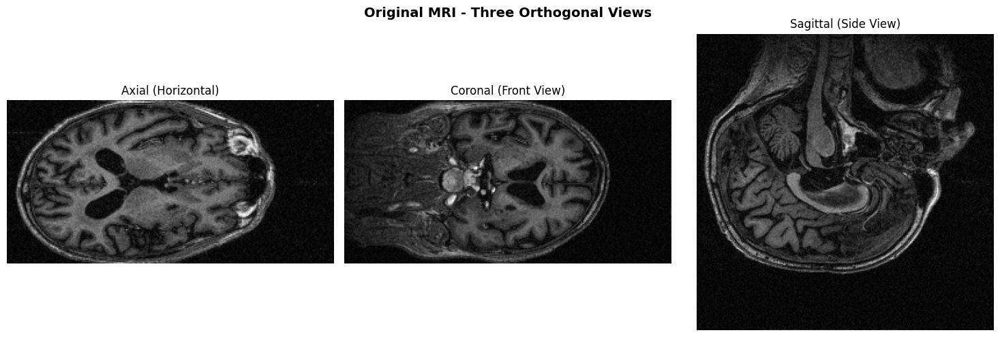

In [14]:
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

# AXIAL (horizontal slice, looking down from top)
# This should be data[:, :, z] - cutting through the z-axis
axes[0].imshow(np.rot90(test_data[:, 128, :]), cmap='gray', origin='lower')
axes[0].set_title('Axial (Horizontal)', fontsize=12)
axes[0].axis('off')

# CORONAL (front-to-back slice, looking from front)  
# This should be data[x, :, :] - cutting through the x-axis
axes[1].imshow(np.rot90(test_data[128, :, :]), cmap='gray', origin='lower')
axes[1].set_title('Coronal (Front View)', fontsize=12)
axes[1].axis('off')

# SAGITTAL (left-to-right slice, looking from side)
# This should be data[:, :, z] - cutting through to see side profile
axes[2].imshow(np.rot90(test_data[:, :, 64]), cmap='gray', origin='lower')
axes[2].set_title('Sagittal (Side View)', fontsize=12)
axes[2].axis('off')

plt.suptitle('Original MRI - Three Orthogonal Views', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

### Skull Stripping

In [15]:
print("🧠 Skull stripping (this takes ~30-60 seconds)...")
brain_extraction = antspynet.brain_extraction(test_img, modality="t1")
test_brain = test_img * brain_extraction['brain_mask']
test_brain_data = test_brain.numpy()

print(f"   Removed {100*(1-test_brain_data.sum()/test_data.sum()):.1f}% of volume")
print("   ✅ Complete")

🧠 Skull stripping (this takes ~30-60 seconds)...
   Removed 62.2% of volume
   ✅ Complete


### Hippocampus Segmentation (HippMapp3r) 🎯

In [16]:
print("🗺️  Running HippMapp3r (this takes ~1-2 minutes)...")

# CORRECTED FUNCTION NAME:
hippo_seg = antspynet.hippmapp3r_segmentation(test_brain)

hippo_data = hippo_seg.numpy()

# Calculate volumes
voxel_vol_cm3 = np.prod(test_brain.spacing) / 1000
left_vol = np.sum(hippo_data == 1) * voxel_vol_cm3
right_vol = np.sum(hippo_data == 2) * voxel_vol_cm3
total_vol = (left_vol + right_vol)

print(f"\n📊 Hippocampus Volumes:")
print(f"   Left:  {left_vol:.2f} cm³")
print(f"   Right: {right_vol:.2f} cm³")
print(f"   Total: {total_vol:.2f} cm³")

if 6 <= total_vol <= 10:
    print(f"   ✅ Volume in expected range (6-10 cm³)")
else:
    print(f"   ⚠️  Volume outside expected range - verify results")

🗺️  Running HippMapp3r (this takes ~1-2 minutes)...

📊 Hippocampus Volumes:
   Left:  1.69 cm³
   Right: 2.77 cm³
   Total: 4.45 cm³
   ⚠️  Volume outside expected range - verify results


### Visualize Results

Best slices found:
  Axial: 105/256
  Coronal: 114/256
  Sagittal: 38/128


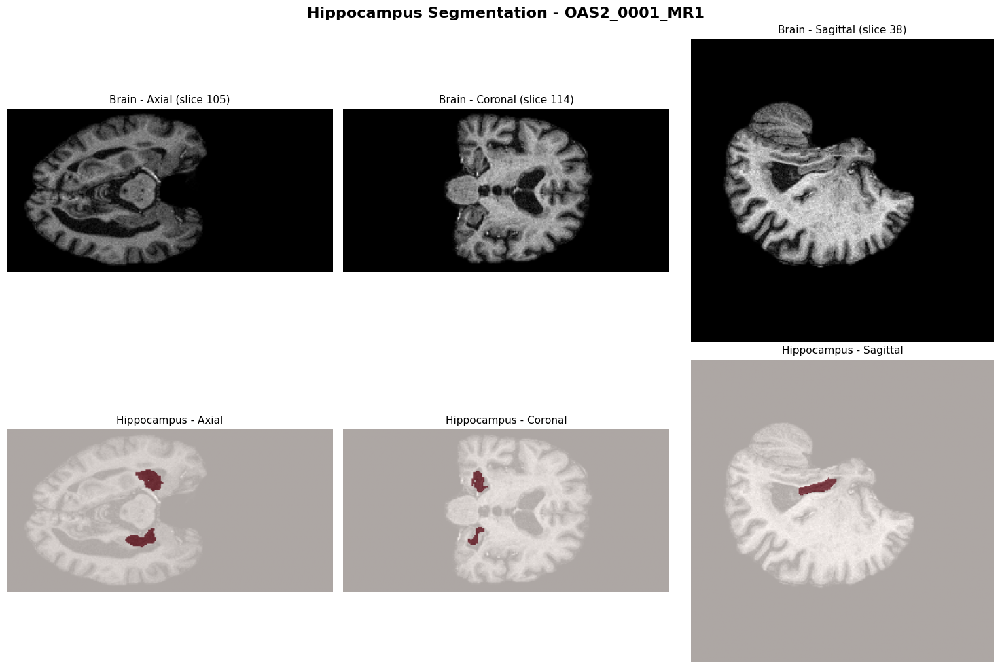


✅ Verify hippocampus location:
   Axial: Both left and right hippocampi should be visible (red regions)
   Coronal: Hippocampi appear as curved structures in temporal lobes
   Sagittal: One hippocampus visible on the side of the brain


In [18]:
# Find best slices for each view
# The hippocampus is located in the medial temporal lobe
# We need to find the slice with maximum hippocampus area for each orientation

hippo_mask = hippo_data > 0

# Find best AXIAL slice (horizontal, top-down view)
# For axial, we slice through y-axis: data[:, y, :]
best_axial = 0
max_axial_area = 0
for y in range(hippo_data.shape[1]):
    area = np.sum(hippo_mask[:, y, :])
    if area > max_axial_area:
        max_axial_area = area
        best_axial = y

# Find best CORONAL slice (front-to-back view)
# For coronal, we slice through x-axis: data[x, :, :]
best_coronal = 0
max_coronal_area = 0
for x in range(hippo_data.shape[0]):
    area = np.sum(hippo_mask[x, :, :])
    if area > max_coronal_area:
        max_coronal_area = area
        best_coronal = x

# Find best SAGITTAL slice (side view)
# For sagittal, we slice through z-axis: data[:, :, z]
best_sagittal = 0
max_sagittal_area = 0
for z in range(hippo_data.shape[2]):
    area = np.sum(hippo_mask[:, :, z])
    if area > max_sagittal_area:
        max_sagittal_area = area
        best_sagittal = z

print(f"Best slices found:")
print(f"  Axial: {best_axial}/{hippo_data.shape[1]}")
print(f"  Coronal: {best_coronal}/{hippo_data.shape[0]}")
print(f"  Sagittal: {best_sagittal}/{hippo_data.shape[2]}")

fig, axes = plt.subplots(2, 3, figsize=(15, 10))

# Top row: Brain only
# AXIAL (horizontal/transverse plane)
axes[0, 0].imshow(np.rot90(test_brain_data[:, best_axial, :]), cmap='gray', origin='lower')
axes[0, 0].set_title(f'Brain - Axial (slice {best_axial})', fontsize=11)
axes[0, 0].axis('off')

# CORONAL (front-to-back plane)
axes[0, 1].imshow(np.rot90(test_brain_data[best_coronal, :, :]), cmap='gray', origin='lower')
axes[0, 1].set_title(f'Brain - Coronal (slice {best_coronal})', fontsize=11)
axes[0, 1].axis('off')

# SAGITTAL (left-to-right plane)
axes[0, 2].imshow(np.rot90(test_brain_data[:, :, best_sagittal]), cmap='gray', origin='lower')
axes[0, 2].set_title(f'Brain - Sagittal (slice {best_sagittal})', fontsize=11)
axes[0, 2].axis('off')

# Bottom row: Hippocampus overlay
# AXIAL with hippocampus
axes[1, 0].imshow(np.rot90(test_brain_data[:, best_axial, :]), cmap='gray', origin='lower', alpha=0.8)
axes[1, 0].imshow(np.rot90(hippo_mask[:, best_axial, :]), cmap='Reds', origin='lower', alpha=0.6)
axes[1, 0].set_title('Hippocampus - Axial', fontsize=11)
axes[1, 0].axis('off')

# CORONAL with hippocampus
axes[1, 1].imshow(np.rot90(test_brain_data[best_coronal, :, :]), cmap='gray', origin='lower', alpha=0.8)
axes[1, 1].imshow(np.rot90(hippo_mask[best_coronal, :, :]), cmap='Reds', origin='lower', alpha=0.6)
axes[1, 1].set_title('Hippocampus - Coronal', fontsize=11)
axes[1, 1].axis('off')

# SAGITTAL with hippocampus
axes[1, 2].imshow(np.rot90(test_brain_data[:, :, best_sagittal]), cmap='gray', origin='lower', alpha=0.8)
axes[1, 2].imshow(np.rot90(hippo_mask[:, :, best_sagittal]), cmap='Reds', origin='lower', alpha=0.6)
axes[1, 2].set_title('Hippocampus - Sagittal', fontsize=11)
axes[1, 2].axis('off')

plt.suptitle(f'Hippocampus Segmentation - {test_scan["scan_name"]}', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()

print("\n✅ Verify hippocampus location:")
print("   Axial: Both left and right hippocampi should be visible (red regions)")
print("   Coronal: Hippocampi appear as curved structures in temporal lobes")
print("   Sagittal: One hippocampus visible on the side of the brain")

### 3D Visualization

In [11]:
print("🎨 Creating 3D visualization...")

# Brain surface
brain_thresh = np.percentile(test_brain_data[test_brain_data > 0], 70)
brain_verts, brain_faces, _, _ = measure.marching_cubes(test_brain_data, level=brain_thresh, step_size=2)

# Hippocampus surface
hippo_only = test_brain_data * hippo_mask
hippo_thresh = np.percentile(hippo_only[hippo_only > 0], 20)
hippo_verts, hippo_faces, _, _ = measure.marching_cubes(hippo_only, level=hippo_thresh, step_size=1)

fig = go.Figure()

fig.add_trace(go.Mesh3d(
    x=brain_verts[:, 0], y=brain_verts[:, 1], z=brain_verts[:, 2],
    i=brain_faces[:, 0], j=brain_faces[:, 1], k=brain_faces[:, 2],
    color='lightblue', opacity=0.3, name='Brain'
))

fig.add_trace(go.Mesh3d(
    x=hippo_verts[:, 0], y=hippo_verts[:, 1], z=hippo_verts[:, 2],
    i=hippo_faces[:, 0], j=hippo_faces[:, 1], k=hippo_faces[:, 2],
    color='red', opacity=0.95, name='Hippocampus'
))

fig.update_layout(
    title=f'3D Hippocampus - {test_scan["scan_name"]}',
    scene=dict(
        xaxis_title='X', yaxis_title='Y', zaxis_title='Z',
        camera=dict(eye=dict(x=1.5, y=1.5, z=1.2)),
        bgcolor='white'
    ),
    width=900, height=700
)

fig.show()
print("✅ 3D visualization complete")

🎨 Creating 3D visualization...


✅ 3D visualization complete


In [12]:
print("🎨 Creating interactive 3D visualization...")

# Brain surface
brain_thresh = np.percentile(test_brain_data[test_brain_data > 0], 70)
brain_verts, brain_faces, _, _ = measure.marching_cubes(test_brain_data, level=brain_thresh, step_size=3)
print(f"   Brain: {len(brain_verts):,} vertices")

# Hippocampus surface
hippo_verts, hippo_faces, _, _ = measure.marching_cubes(hippo_data, level=0.5, step_size=1)
print(f"   Hippocampus: {len(hippo_verts):,} vertices")

# Create figure
fig = go.Figure()

fig.add_trace(go.Mesh3d(
    x=brain_verts[:, 0], y=brain_verts[:, 1], z=brain_verts[:, 2],
    i=brain_faces[:, 0], j=brain_faces[:, 1], k=brain_faces[:, 2],
    color='lightblue', opacity=0.15, name='Brain'
))

fig.add_trace(go.Mesh3d(
    x=hippo_verts[:, 0], y=hippo_verts[:, 1], z=hippo_verts[:, 2],
    i=hippo_faces[:, 0], j=hippo_faces[:, 1], k=hippo_faces[:, 2],
    color='red', opacity=0.95, name='Hippocampus'
))

fig.update_layout(
    title=f'3D Hippocampus - {test_scan["scan_name"]}',
    scene=dict(camera=dict(eye=dict(x=1.5, y=1.5, z=1.2)), bgcolor='white'),
    width=1100, height=900
)

# Save as HTML
html_file = VIZ_DIR / f"3D_{test_scan['scan_name']}.html"
fig.write_html(str(html_file))
print(f"✅ Interactive 3D saved: {html_file}")

# Configure renderer for VS Code
import plotly.io as pio
pio.renderers.default = "plotly_mimetype+notebook_connected"

# Show inline
fig.show()
print("\n✅ If you don't see it inline above, open the HTML file!")

🎨 Creating interactive 3D visualization...
   Brain: 44,484 vertices
   Hippocampus: 3,376 vertices
✅ Interactive 3D saved: C:\Users\Ratul\Desktop\cv\results\visualizations\3D_OAS2_0001_MR1.html



✅ If you don't see it inline above, open the HTML file!


## 6️⃣ Process All Scans

⏱️ **Estimated time: 2-4 hours for 771 scans**

In [13]:
def process_scan(scan_row, save=True):
    try:
        # Load
        img = ants.image_read(scan_row['img_path'])
        
        # Skull strip
        brain_ext = antspynet.brain_extraction(img, modality="t1")
        brain = img * brain_ext['brain_mask']
        
        # Segment hippocampus
        hippo = antspynet.hippmapp3r_segmentation(brain)
        hippo_data = hippo.numpy()
        
        # Calculate volumes
        voxel_vol = np.prod(brain.spacing) / 1000
        left_vol = np.sum(hippo_data == 1) * voxel_vol
        right_vol = np.sum(hippo_data == 2) * voxel_vol
        
        result = {
            'scan_name': scan_row['scan_name'],
            'patient_id': scan_row['patient_id'],
            'session': scan_row['session'],
            'status': 'success',
            'left_cm3': left_vol,
            'right_cm3': right_vol,
            'total_cm3': left_vol + right_vol,
            'voxel_size_mm': tuple(brain.spacing)
        }
        
        if save:
            ants.image_write(brain, str(SKULL_STRIPPED_DIR / f"{scan_row['scan_name']}_brain.nii.gz"))
            ants.image_write(hippo, str(HIPPOCAMPUS_DIR / f"{scan_row['scan_name']}_hippo.nii.gz"))
        
        return result
    
    except Exception as e:
        return {
            'scan_name': scan_row['scan_name'],
            'patient_id': scan_row['patient_id'],
            'session': scan_row['session'],
            'status': 'failed',
            'error': str(e)
        }

print("✅ Function ready")
print("\n⚠️  Run next cell to process all scans (takes 2-4 hours)")

✅ Function ready

⚠️  Run next cell to process all scans (takes 2-4 hours)


In [14]:
from tqdm.auto import tqdm
import time

print(f"🚀 Processing {len(scans_df)} scans...\n")
results = []
start = time.time()

for idx, row in tqdm(scans_df.iterrows(), total=len(scans_df)):
    result = process_scan(row)
    results.append(result)
    
    if (idx + 1) % 50 == 0:
        pd.DataFrame(results).to_csv(VOLUMES_DIR / "progress.csv", index=False)
        elapsed = (time.time() - start) / 60
        remaining = (elapsed / (idx + 1)) * (len(scans_df) - idx - 1)
        print(f"   {idx+1}/{len(scans_df)} | Elapsed: {elapsed:.1f}m | Remaining: ~{remaining:.1f}m")

results_df = pd.DataFrame(results)
results_df.to_csv(VOLUMES_DIR / "hippocampus_volumes_all.csv", index=False)

print(f"\n✅ Complete in {(time.time()-start)/60:.1f} minutes")
print(f"   Successful: {(results_df['status']=='success').sum()}")
print(f"   Failed: {(results_df['status']=='failed').sum()}")

🚀 Processing 209 scans...



  0%|          | 0/209 [00:00<?, ?it/s]

   50/209 | Elapsed: 41.4m | Remaining: ~131.7m
   100/209 | Elapsed: 83.3m | Remaining: ~90.8m
   150/209 | Elapsed: 136.1m | Remaining: ~53.5m
   200/209 | Elapsed: 210.2m | Remaining: ~9.5m

✅ Complete in 222.1 minutes
   Successful: 176
   Failed: 33


In [15]:
# Quick check
print(f"Total scans processed: {len(results_df)}")
print(f"Successful: {(results_df['status']=='success').sum()}")
print(f"Patients with data: {results_df[results_df['status']=='success']['patient_id'].nunique()}")

Total scans processed: 209
Successful: 176
Patients with data: 78


In [16]:
# Check the actual errors
print("Current errors:")
print(results_df['error'].value_counts())

print("\n\nFirst error in detail:")
print(results_df.iloc[0]['error'])

Current errors:
error
D:\a\ANTsPy\ANTsPy\itksource\Modules\Core\Common\src\itkDataObject.cxx:367:\nRequested region is (at least partially) outside the largest possible region.    33
Name: count, dtype: int64


First error in detail:
nan


In [17]:
# See what errors occurred
print("❌ Failed scans - Error summary:\n")
print(results_df['error'].value_counts())

print("\n\n📋 First 5 errors in detail:")
for idx, row in results_df.head(5).iterrows():
    print(f"\n{row['scan_name']}:")
    print(f"   Error: {row['error']}")  

❌ Failed scans - Error summary:

error
D:\a\ANTsPy\ANTsPy\itksource\Modules\Core\Common\src\itkDataObject.cxx:367:\nRequested region is (at least partially) outside the largest possible region.    33
Name: count, dtype: int64


📋 First 5 errors in detail:

OAS2_0001_MR1:
   Error: nan

OAS2_0001_MR2:
   Error: D:\a\ANTsPy\ANTsPy\itksource\Modules\Core\Common\src\itkDataObject.cxx:367:
Requested region is (at least partially) outside the largest possible region.

OAS2_0002_MR1:
   Error: D:\a\ANTsPy\ANTsPy\itksource\Modules\Core\Common\src\itkDataObject.cxx:367:
Requested region is (at least partially) outside the largest possible region.

OAS2_0002_MR2:
   Error: nan

OAS2_0002_MR3:
   Error: D:\a\ANTsPy\ANTsPy\itksource\Modules\Core\Common\src\itkDataObject.cxx:367:
Requested region is (at least partially) outside the largest possible region.


## 7️⃣ Longitudinal Analysis

In [18]:
success = results_df[results_df['status'] == 'success']
multi_session = success.groupby('patient_id').size()
multi_patients = multi_session[multi_session > 1].index

print(f"📊 Patients with multiple sessions: {len(multi_patients)}")

changes = []
for pid in multi_patients:
    patient = success[success['patient_id'] == pid].sort_values('session')
    if len(patient) >= 2:
        first = patient.iloc[0]
        last = patient.iloc[-1]
        change = last['total_cm3'] - first['total_cm3']
        change_pct = (change / first['total_cm3']) * 100
        
        changes.append({
            'patient_id': pid,
            'sessions': len(patient),
            'first_vol': first['total_cm3'],
            'last_vol': last['total_cm3'],
            'change_cm3': change,
            'change_pct': change_pct
        })

long_df = pd.DataFrame(changes)
long_df.to_csv(VOLUMES_DIR / "longitudinal_changes.csv", index=False)

print(f"\nVolume Change Statistics:")
print(long_df[['change_cm3', 'change_pct']].describe())

print(f"\nTop 10 patients with largest decrease:")
long_df.nsmallest(10, 'change_cm3')[['patient_id', 'sessions', 'change_cm3', 'change_pct']]

📊 Patients with multiple sessions: 64

Volume Change Statistics:
       change_cm3  change_pct
count   64.000000   64.000000
mean    -0.222324   -0.872524
std      0.915794   33.455843
min     -2.575000  -54.834190
25%     -0.606875  -11.885861
50%     -0.237500   -4.520149
75%      0.249375    5.954989
max      2.768750  151.816313

Top 10 patients with largest decrease:


,patient_id,sessions,change_cm3,change_pct
7,0020,2,-2.57500,-54.011536
18,0034,2,-2.23875,-52.831858
32,0050,2,-1.83000,-33.272727
51,0080,3,-1.80625,-40.261911
1,0007,3,-1.76875,-40.556033
42,0064,3,-1.66875,-36.535304
50,0079,2,-1.50375,-29.637842
8,0021,2,-1.46750,-54.834190
22,0040,3,-1.07125,-29.623228
63,0099,2,-0.99125,-34.151593


## 8️⃣ Summary Plots

📂 Loading existing results...
✅ Loaded 209 total scans
✅ 176 successful scans
✅ 78 unique patients

📊 Calculating longitudinal changes...
✅ Found 64 patients with multiple sessions
✅ Longitudinal analysis complete: 64 patients
   Mean change: -0.222 ± 0.916 cm³
   Patients with decrease: 39
   Patients with increase: 25

🎨 Creating improved summary plots...
✅ Improved summary plots saved!


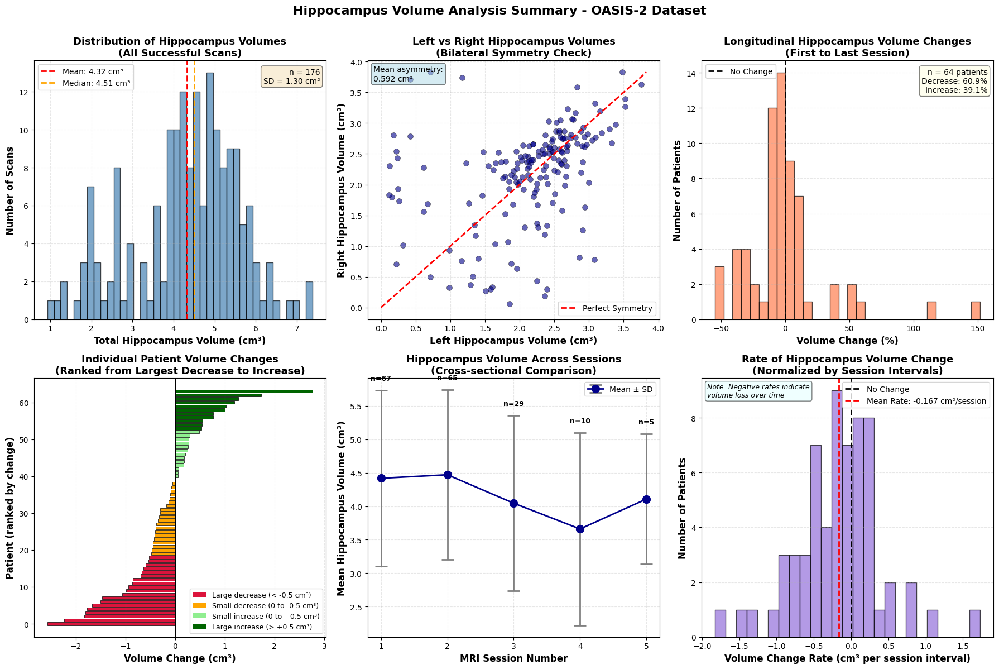


SUMMARY
✅ All analysis complete - no re-processing needed!
✅ Results saved to: C:\Users\Ratul\Desktop\cv\results\visualizations\summary.png
✅ Longitudinal data: C:\Users\Ratul\Desktop\cv\results\volumes\longitudinal_changes.csv


In [ ]:
# ============================================================================
# LOAD EXISTING RESULTS 
# ============================================================================

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
from matplotlib.patches import Patch

# Define paths
BASE_DIR = Path(r"C:\Users\Ratul\Desktop\cv")
RESULTS_DIR = BASE_DIR / "results"
VOLUMES_DIR = RESULTS_DIR / "volumes"
VIZ_DIR = RESULTS_DIR / "visualizations"

# Load existing volume data
print("📂 Loading existing results...")
results_df = pd.read_csv(VOLUMES_DIR / "hippocampus_volumes_all.csv")

# Filter successful scans
success = results_df[results_df['status'] == 'success'].copy()

print(f"✅ Loaded {len(results_df)} total scans")
print(f"✅ {len(success)} successful scans")
print(f"✅ {success['patient_id'].nunique()} unique patients")

# ============================================================================
# CALCULATE LONGITUDINAL CHANGES
# ============================================================================

print("\n📊 Calculating longitudinal changes...")

# Find patients with multiple sessions
multi_session = success.groupby('patient_id').size()
multi_patients = multi_session[multi_session > 1].index

print(f"✅ Found {len(multi_patients)} patients with multiple sessions")

# Calculate changes
changes = []
for pid in multi_patients:
    patient_data = success[success['patient_id'] == pid].sort_values('session')
    
    if len(patient_data) >= 2:
        first = patient_data.iloc[0]
        last = patient_data.iloc[-1]
        
        change_cm3 = last['total_cm3'] - first['total_cm3']
        change_pct = (change_cm3 / first['total_cm3']) * 100
        time_span = last['session'] - first['session']
        
        changes.append({
            'patient_id': pid,
            'n_sessions': len(patient_data),
            'first_session': first['session'],
            'last_session': last['session'],
            'time_span_sessions': time_span,
            'first_volume_cm3': first['total_cm3'],
            'last_volume_cm3': last['total_cm3'],
            'change_cm3': change_cm3,
            'change_pct': change_pct,
            'rate_cm3_per_session': change_cm3 / time_span if time_span > 0 else 0
        })

long_df = pd.DataFrame(changes)

# Save longitudinal data
long_df.to_csv(VOLUMES_DIR / "longitudinal_changes.csv", index=False)
print(f"✅ Longitudinal analysis complete: {len(long_df)} patients")
print(f"   Mean change: {long_df['change_cm3'].mean():.3f} ± {long_df['change_cm3'].std():.3f} cm³")
print(f"   Patients with decrease: {(long_df['change_cm3'] < 0).sum()}")
print(f"   Patients with increase: {(long_df['change_cm3'] > 0).sum()}")

# ============================================================================
# CREATE IMPROVED SUMMARY PLOTS
# ============================================================================

print("\n🎨 Creating improved summary plots...")

fig, axes = plt.subplots(2, 3, figsize=(18, 12))

# ============ Plot 1: Volume Distribution ============
ax = axes[0, 0]
n, bins, patches = ax.hist(success['total_cm3'], bins=40, color='steelblue', 
                            edgecolor='black', alpha=0.7)
mean_vol = success['total_cm3'].mean()
median_vol = success['total_cm3'].median()
ax.axvline(mean_vol, color='red', linestyle='--', linewidth=2, 
           label=f'Mean: {mean_vol:.2f} cm³')
ax.axvline(median_vol, color='orange', linestyle='--', linewidth=2, 
           label=f'Median: {median_vol:.2f} cm³')

ax.set_xlabel('Total Hippocampus Volume (cm³)', fontsize=12, fontweight='bold')
ax.set_ylabel('Number of Scans', fontsize=12, fontweight='bold')
ax.set_title('Distribution of Hippocampus Volumes\n(All Successful Scans)', 
             fontsize=13, fontweight='bold')
ax.legend(fontsize=10)
ax.grid(True, alpha=0.3, linestyle='--')

stats_text = f'n = {len(success)}\nSD = {success["total_cm3"].std():.2f} cm³'
ax.text(0.98, 0.97, stats_text, transform=ax.transAxes, 
        verticalalignment='top', horizontalalignment='right',
        bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5),
        fontsize=10)

# ============ Plot 2: Left vs Right Hemisphere ============
ax = axes[0, 1]
ax.scatter(success['left_cm3'], success['right_cm3'], 
           alpha=0.6, s=50, c='darkblue', edgecolors='black', linewidth=0.5)

max_val = max(success['left_cm3'].max(), success['right_cm3'].max())
ax.plot([0, max_val], [0, max_val], 'r--', linewidth=2, label='Perfect Symmetry')

ax.set_xlabel('Left Hippocampus Volume (cm³)', fontsize=12, fontweight='bold')
ax.set_ylabel('Right Hippocampus Volume (cm³)', fontsize=12, fontweight='bold')
ax.set_title('Left vs Right Hippocampus Volumes\n(Bilateral Symmetry Check)', 
             fontsize=13, fontweight='bold')
ax.legend(fontsize=10)
ax.grid(True, alpha=0.3, linestyle='--')

asymmetry = np.abs(success['left_cm3'] - success['right_cm3'])
mean_asymm = asymmetry.mean()
ax.text(0.02, 0.98, f'Mean asymmetry:\n{mean_asymm:.3f} cm³', 
        transform=ax.transAxes, verticalalignment='top',
        bbox=dict(boxstyle='round', facecolor='lightblue', alpha=0.5),
        fontsize=10)

# ============ Plot 3: Longitudinal Volume Changes (%) ============
ax = axes[0, 2]
n, bins, patches = ax.hist(long_df['change_pct'], bins=30, 
                            color='coral', edgecolor='black', alpha=0.7)
ax.axvline(0, color='black', linestyle='--', linewidth=2, label='No Change')

ax.set_xlabel('Volume Change (%)', fontsize=12, fontweight='bold')
ax.set_ylabel('Number of Patients', fontsize=12, fontweight='bold')
ax.set_title('Longitudinal Hippocampus Volume Changes\n(First to Last Session)', 
             fontsize=13, fontweight='bold')
ax.legend(fontsize=10)
ax.grid(True, alpha=0.3, axis='y', linestyle='--')

decrease_pct = (long_df['change_pct'] < 0).sum() / len(long_df) * 100
increase_pct = (long_df['change_pct'] > 0).sum() / len(long_df) * 100
stats_text = f'n = {len(long_df)} patients\nDecrease: {decrease_pct:.1f}%\nIncrease: {increase_pct:.1f}%'
ax.text(0.98, 0.97, stats_text, transform=ax.transAxes, 
        verticalalignment='top', horizontalalignment='right',
        bbox=dict(boxstyle='round', facecolor='lightyellow', alpha=0.5),
        fontsize=10)

# ============ Plot 4: Individual Patient Changes ============
ax = axes[1, 0]
sorted_changes = long_df.sort_values('change_cm3')
colors = ['crimson' if x < -0.5 else 'orange' if x < 0 else 'lightgreen' if x < 0.5 else 'darkgreen' 
          for x in sorted_changes['change_cm3']]

bars = ax.barh(range(len(sorted_changes)), sorted_changes['change_cm3'], color=colors, 
                edgecolor='black', linewidth=0.5)
ax.axvline(0, color='black', linestyle='-', linewidth=2)

ax.set_xlabel('Volume Change (cm³)', fontsize=12, fontweight='bold')
ax.set_ylabel('Patient (ranked by change)', fontsize=12, fontweight='bold')
ax.set_title('Individual Patient Volume Changes\n(Ranked from Largest Decrease to Increase)', 
             fontsize=13, fontweight='bold')
ax.grid(True, alpha=0.3, axis='x', linestyle='--')

legend_elements = [
    Patch(facecolor='crimson', label='Large decrease (< -0.5 cm³)'),
    Patch(facecolor='orange', label='Small decrease (0 to -0.5 cm³)'),
    Patch(facecolor='lightgreen', label='Small increase (0 to +0.5 cm³)'),
    Patch(facecolor='darkgreen', label='Large increase (> +0.5 cm³)')
]
ax.legend(handles=legend_elements, loc='lower right', fontsize=9)

# ============ Plot 5: Volume by Session ============
ax = axes[1, 1]

session_stats = success.groupby('session')['total_cm3'].agg(['mean', 'std', 'count'])
session_stats = session_stats[session_stats['count'] >= 3]

ax.errorbar(session_stats.index, session_stats['mean'], 
            yerr=session_stats['std'], fmt='o-', markersize=10, 
            linewidth=2, capsize=8, capthick=2, color='darkblue',
            ecolor='gray', label='Mean ± SD')

for idx, row in session_stats.iterrows():
    ax.text(idx, row['mean'] + row['std'] + 0.15, f'n={int(row["count"])}', 
            ha='center', fontsize=9, fontweight='bold')

ax.set_xlabel('MRI Session Number', fontsize=12, fontweight='bold')
ax.set_ylabel('Mean Hippocampus Volume (cm³)', fontsize=12, fontweight='bold')
ax.set_title('Hippocampus Volume Across Sessions\n(Cross-sectional Comparison)', 
             fontsize=13, fontweight='bold')
ax.grid(True, alpha=0.3, linestyle='--')
ax.legend(fontsize=10)
ax.set_xticks(session_stats.index)

# ============ Plot 6: Change Rate per Session ============
ax = axes[1, 2]

rates = long_df['rate_cm3_per_session']
mean_rate = rates.mean()
std_rate = rates.std()
filtered_rates = rates[(rates > mean_rate - 3*std_rate) & (rates < mean_rate + 3*std_rate)]

n, bins, patches = ax.hist(filtered_rates, bins=25, color='mediumpurple', 
                            edgecolor='black', alpha=0.7)
ax.axvline(0, color='black', linestyle='--', linewidth=2, label='No Change')
ax.axvline(filtered_rates.mean(), color='red', linestyle='--', linewidth=2, 
           label=f'Mean Rate: {filtered_rates.mean():.3f} cm³/session')

ax.set_xlabel('Volume Change Rate (cm³ per session interval)', fontsize=12, fontweight='bold')
ax.set_ylabel('Number of Patients', fontsize=12, fontweight='bold')
ax.set_title('Rate of Hippocampus Volume Change\n(Normalized by Session Intervals)', 
             fontsize=13, fontweight='bold')
ax.legend(fontsize=10)
ax.grid(True, alpha=0.3, axis='y', linestyle='--')

note = 'Note: Negative rates indicate\nvolume loss over time'
ax.text(0.02, 0.98, note, transform=ax.transAxes, 
        verticalalignment='top',
        bbox=dict(boxstyle='round', facecolor='lightcyan', alpha=0.5),
        fontsize=9, style='italic')

# ============ Final touches ============
plt.suptitle('Hippocampus Volume Analysis Summary - OASIS-2 Dataset', 
             fontsize=16, fontweight='bold', y=0.995)
plt.tight_layout(rect=[0, 0, 1, 0.99])

plt.savefig(VIZ_DIR / "summary.png", dpi=300, bbox_inches='tight')
print("✅ Improved summary plots saved!")
plt.show()

print("\n" + "="*70)
print("SUMMARY")
print("="*70)
print(f"✅ All analysis complete - no re-processing needed!")
print(f"✅ Results saved to: {VIZ_DIR / 'summary.png'}")
print(f"✅ Longitudinal data: {VOLUMES_DIR / 'longitudinal_changes.csv'}")
print("="*70)

## DEMOGRAPHICS VALIDATION & CLINICAL CORRELATION

In [10]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from pathlib import Path

# Load demographics
print("📂 Loading demographics data...")
demo_df = pd.read_excel(BASE_DIR / "OASIS_demographic.xlsx")

print(f"✅ Loaded {len(demo_df)} demographic records")
print(f"   Columns: {list(demo_df.columns)}")
print(f"\n📊 Demographics preview:")
print(demo_df.head())

# ============================================================================
# MERGE VOLUMES WITH DEMOGRAPHICS
# ============================================================================

print("\n🔗 Merging volume data with demographics...")

# Create scan identifier for merging
# Demographics uses format like "OAS2_0001_MR1"
# Our volumes use "scan_name" with same format
demo_df['scan_name'] = demo_df['MRI ID']  # Adjust column name if needed

# Merge
merged_df = success.merge(demo_df, on='scan_name', how='inner')

print(f"✅ Merged {len(merged_df)} scans with demographic data")
print(f"   Patients with both volume & demographic data: {merged_df['patient_id'].nunique()}")

# Check what we have
print(f"\n📊 Available clinical measures:")
if 'CDR' in merged_df.columns:
    print(f"   ✅ CDR: {merged_df['CDR'].notna().sum()} scans")
    print(f"      Distribution: {merged_df['CDR'].value_counts().sort_index().to_dict()}")
if 'MMSE' in merged_df.columns:
    print(f"   ✅ MMSE: {merged_df['MMSE'].notna().sum()} scans")
if 'Group' in merged_df.columns:
    print(f"   ✅ Group: {merged_df['Group'].value_counts().to_dict()}")
if 'Age' in merged_df.columns:
    print(f"   ✅ Age: {merged_df['Age'].notna().sum()} scans")

# Save merged data
merged_df.to_csv(VOLUMES_DIR / "volumes_with_demographics.csv", index=False)
print(f"\n✅ Saved: volumes_with_demographics.csv")

# ============================================================================
# STATISTICAL COMPARISONS: DEMENTED VS NONDEMENTED
# ============================================================================

print("\n" + "="*70)
print("DEMENTED VS NONDEMENTED COMPARISON")
print("="*70)

if 'Group' in merged_df.columns:
    # Split groups
    demented = merged_df[merged_df['Group'] == 'Demented']
    nondemented = merged_df[merged_df['Group'] == 'Nondemented']
    
    print(f"\nGroup sizes:")
    print(f"   Demented: {len(demented)} scans")
    print(f"   Nondemented: {len(nondemented)} scans")
    
    # Compare volumes
    print(f"\nHippocampus volumes:")
    print(f"   Demented:    {demented['total_cm3'].mean():.2f} ± {demented['total_cm3'].std():.2f} cm³")
    print(f"   Nondemented: {nondemented['total_cm3'].mean():.2f} ± {nondemented['total_cm3'].std():.2f} cm³")
    
    # Statistical test
    t_stat, p_value = stats.ttest_ind(demented['total_cm3'], nondemented['total_cm3'])
    print(f"\nStatistical test (independent t-test):")
    print(f"   t-statistic: {t_stat:.3f}")
    print(f"   p-value: {p_value:.4f}")
    
    if p_value < 0.001:
        print(f"   *** HIGHLY SIGNIFICANT (p < 0.001) ***")
    elif p_value < 0.05:
        print(f"   ** SIGNIFICANT (p < 0.05) **")
    else:
        print(f"   Not significant (p >= 0.05)")
    
    # Effect size (Cohen's d)
    cohens_d = (nondemented['total_cm3'].mean() - demented['total_cm3'].mean()) / \
               np.sqrt((nondemented['total_cm3'].std()**2 + demented['total_cm3'].std()**2) / 2)
    print(f"   Effect size (Cohen's d): {cohens_d:.3f}")
    if abs(cohens_d) < 0.2:
        print(f"      (Small effect)")
    elif abs(cohens_d) < 0.5:
        print(f"      (Medium effect)")
    else:
        print(f"      (Large effect)")

# ============================================================================
# CDR CORRELATION
# ============================================================================

print("\n" + "="*70)
print("CDR CORRELATION ANALYSIS")
print("="*70)

if 'CDR' in merged_df.columns:
    # Remove missing CDR values
    cdr_data = merged_df[merged_df['CDR'].notna()].copy()
    
    print(f"\nScans with CDR data: {len(cdr_data)}")
    print(f"CDR distribution:")
    for cdr_val in sorted(cdr_data['CDR'].unique()):
        count = (cdr_data['CDR'] == cdr_val).sum()
        mean_vol = cdr_data[cdr_data['CDR'] == cdr_val]['total_cm3'].mean()
        std_vol = cdr_data[cdr_data['CDR'] == cdr_val]['total_cm3'].std()
        print(f"   CDR = {cdr_val}: {count} scans, volume = {mean_vol:.2f} ± {std_vol:.2f} cm³")
    
    # Correlation test
    correlation, p_value = stats.spearmanr(cdr_data['CDR'], cdr_data['total_cm3'])
    print(f"\nSpearman correlation:")
    print(f"   ρ = {correlation:.3f}")
    print(f"   p-value: {p_value:.4f}")
    
    if p_value < 0.001:
        print(f"   *** HIGHLY SIGNIFICANT (p < 0.001) ***")
    elif p_value < 0.05:
        print(f"   ** SIGNIFICANT (p < 0.05) **")
    
    # ANOVA across CDR groups
    cdr_groups = [cdr_data[cdr_data['CDR'] == val]['total_cm3'].values 
                  for val in sorted(cdr_data['CDR'].unique())]
    f_stat, p_anova = stats.f_oneway(*cdr_groups)
    print(f"\nOne-way ANOVA:")
    print(f"   F-statistic: {f_stat:.3f}")
    print(f"   p-value: {p_anova:.4f}")

# ============================================================================
# MMSE CORRELATION
# ============================================================================

print("\n" + "="*70)
print("MMSE CORRELATION ANALYSIS")
print("="*70)

if 'MMSE' in merged_df.columns:
    mmse_data = merged_df[merged_df['MMSE'].notna()].copy()
    
    print(f"\nScans with MMSE data: {len(mmse_data)}")
    print(f"MMSE range: {mmse_data['MMSE'].min()} - {mmse_data['MMSE'].max()}")
    print(f"Mean MMSE: {mmse_data['MMSE'].mean():.1f} ± {mmse_data['MMSE'].std():.1f}")
    
    # Correlation
    correlation, p_value = stats.pearsonr(mmse_data['MMSE'], mmse_data['total_cm3'])
    print(f"\nPearson correlation:")
    print(f"   r = {correlation:.3f}")
    print(f"   p-value: {p_value:.4f}")
    
    if p_value < 0.001:
        print(f"   *** HIGHLY SIGNIFICANT (p < 0.001) ***")
    elif p_value < 0.05:
        print(f"   ** SIGNIFICANT (p < 0.05) **")

print("\n" + "="*70)
print("✅ Demographics validation complete!")
print("="*70)


📂 Loading demographics data...
✅ Loaded 373 demographic records
   Columns: ['Subject ID', 'MRI ID', 'Group', 'Visit', 'MR Delay', 'M/F', 'Hand', 'Age', 'EDUC', 'SES', 'MMSE', 'CDR', 'eTIV', 'nWBV', 'ASF']

📊 Demographics preview:
  Subject ID         MRI ID        Group  Visit  MR Delay M/F Hand  Age  EDUC  \
0  OAS2_0001  OAS2_0001_MR1  Nondemented      1         0   M    R   87    14   
1  OAS2_0001  OAS2_0001_MR2  Nondemented      2       457   M    R   88    14   
2  OAS2_0002  OAS2_0002_MR1     Demented      1         0   M    R   75    12   
3  OAS2_0002  OAS2_0002_MR2     Demented      2       560   M    R   76    12   
4  OAS2_0002  OAS2_0002_MR3     Demented      3      1895   M    R   80    12   

   SES  MMSE  CDR         eTIV      nWBV       ASF  
0  2.0  27.0  0.0  1986.550000  0.696106  0.883440  
1  2.0  30.0  0.0  2004.479526  0.681062  0.875539  
2  NaN  23.0  0.5  1678.290000  0.736336  1.045710  
3  NaN  28.0  0.5  1737.620000  0.713402  1.010000  
4  NaN  22.0  0.5


🎨 Creating clinical validation plots...

📊 Converting patient IDs:
   Example: patient_id=4 → Subject ID=OAS2_0004

✅ Merge successful: 64 patients with group data
   Available groups: ['Nondemented', 'Demented']

   Statistical comparison:
   Nondemented: 11.34% ± 37.35% (n=32)
   Demented: -12.45% ± 24.19% (n=27)
   t-statistic: 2.843
   p-value: 0.0062
✅ Clinical validation plots saved!


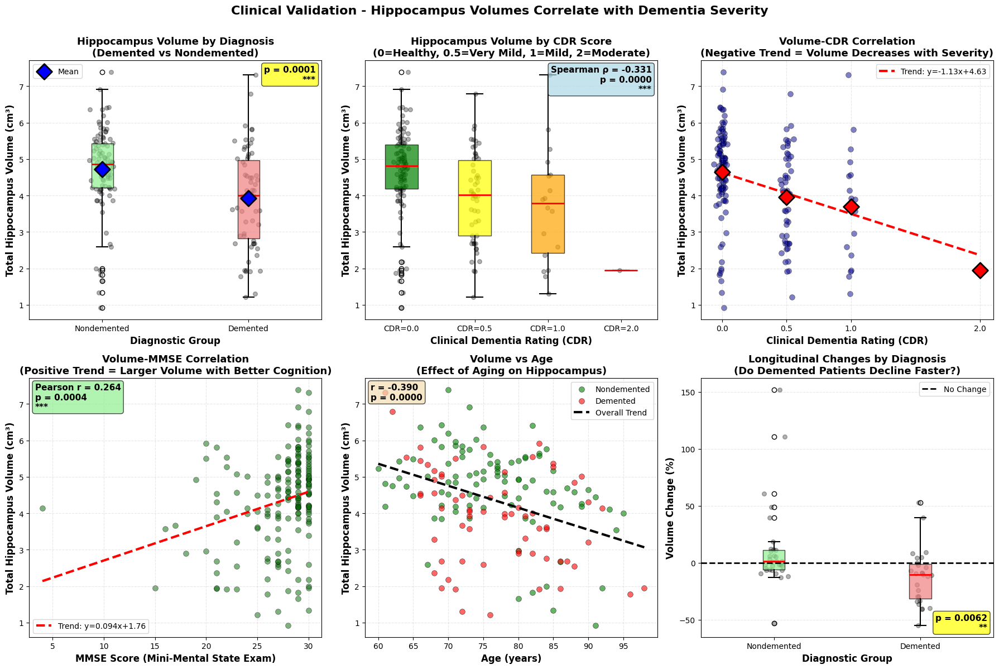


✅ ALL VALIDATION COMPLETE!

📊 Results saved:
   • C:\Users\Ratul\Desktop\cv\results\visualizations\clinical_validation.png
   • C:\Users\Ratul\Desktop\cv\results\volumes\volumes_with_demographics.csv

🎉 Your hippocampus volumes are now clinically validated!


In [14]:
# ============================================================================
# PART 10: CLINICAL VALIDATION PLOTS
# ============================================================================

print("\n🎨 Creating clinical validation plots...")

fig, axes = plt.subplots(2, 3, figsize=(18, 12))

# ============================================================================
# Plot 1: Demented vs Nondemented (Box Plot)
# ============================================================================
ax = axes[0, 0]

if 'Group' in merged_df.columns:
    groups = ['Nondemented', 'Demented']
    data_to_plot = [merged_df[merged_df['Group'] == g]['total_cm3'].dropna() for g in groups]
    
    bp = ax.boxplot(data_to_plot, labels=groups, patch_artist=True,
                    boxprops=dict(facecolor='lightblue', alpha=0.7),
                    medianprops=dict(color='red', linewidth=2),
                    whiskerprops=dict(linewidth=1.5),
                    capprops=dict(linewidth=1.5))
    
    # Color the boxes differently
    bp['boxes'][0].set_facecolor('lightgreen')
    bp['boxes'][1].set_facecolor('lightcoral')
    
    # Add individual points
    for i, g in enumerate(groups):
        y = merged_df[merged_df['Group'] == g]['total_cm3'].dropna()
        x = np.random.normal(i+1, 0.04, size=len(y))
        ax.scatter(x, y, alpha=0.3, s=30, color='black')
    
    # Add mean markers
    for i, g in enumerate(groups):
        mean_val = merged_df[merged_df['Group'] == g]['total_cm3'].mean()
        ax.scatter(i+1, mean_val, color='blue', s=200, marker='D', 
                  edgecolors='black', linewidth=2, zorder=10, label='Mean' if i==0 else '')
    
    ax.set_ylabel('Total Hippocampus Volume (cm³)', fontsize=12, fontweight='bold')
    ax.set_xlabel('Diagnostic Group', fontsize=12, fontweight='bold')
    ax.set_title('Hippocampus Volume by Diagnosis\n(Demented vs Nondemented)', 
                fontsize=13, fontweight='bold')
    ax.grid(True, alpha=0.3, axis='y', linestyle='--')
    ax.legend(fontsize=10)
    
    # Add statistics text
    demented = merged_df[merged_df['Group'] == 'Demented']
    nondemented = merged_df[merged_df['Group'] == 'Nondemented']
    t_stat, p_value = stats.ttest_ind(demented['total_cm3'], nondemented['total_cm3'])
    
    sig_text = f"p = {p_value:.4f}"
    if p_value < 0.001:
        sig_text += "\n***"
    elif p_value < 0.01:
        sig_text += "\n**"
    elif p_value < 0.05:
        sig_text += "\n*"
    
    ax.text(0.98, 0.98, sig_text, transform=ax.transAxes,
           verticalalignment='top', horizontalalignment='right',
           bbox=dict(boxstyle='round', facecolor='yellow', alpha=0.7),
           fontsize=11, fontweight='bold')

# ============================================================================
# Plot 2: Volume vs CDR (Box Plot by CDR Group)
# ============================================================================
ax = axes[0, 1]

if 'CDR' in merged_df.columns:
    cdr_data = merged_df[merged_df['CDR'].notna()].copy()
    cdr_values = sorted(cdr_data['CDR'].unique())
    
    data_to_plot = [cdr_data[cdr_data['CDR'] == val]['total_cm3'].values for val in cdr_values]
    labels = [f'CDR={val}' for val in cdr_values]
    
    bp = ax.boxplot(data_to_plot, labels=labels, patch_artist=True,
                    boxprops=dict(alpha=0.7),
                    medianprops=dict(color='red', linewidth=2),
                    whiskerprops=dict(linewidth=1.5),
                    capprops=dict(linewidth=1.5))
    
    # Color boxes by severity
    colors = ['green', 'yellow', 'orange', 'red']
    for patch, color in zip(bp['boxes'], colors[:len(bp['boxes'])]):
        patch.set_facecolor(color)
    
    # Add individual points
    for i, val in enumerate(cdr_values):
        y = cdr_data[cdr_data['CDR'] == val]['total_cm3'].values
        x = np.random.normal(i+1, 0.04, size=len(y))
        ax.scatter(x, y, alpha=0.3, s=30, color='black')
    
    ax.set_ylabel('Total Hippocampus Volume (cm³)', fontsize=12, fontweight='bold')
    ax.set_xlabel('Clinical Dementia Rating (CDR)', fontsize=12, fontweight='bold')
    ax.set_title('Hippocampus Volume by CDR Score\n(0=Healthy, 0.5=Very Mild, 1=Mild, 2=Moderate)', 
                fontsize=13, fontweight='bold')
    ax.grid(True, alpha=0.3, axis='y', linestyle='--')
    
    # Add correlation statistics
    correlation, p_value = stats.spearmanr(cdr_data['CDR'], cdr_data['total_cm3'])
    stats_text = f"Spearman ρ = {correlation:.3f}\np = {p_value:.4f}"
    if p_value < 0.001:
        stats_text += "\n***"
    
    ax.text(0.98, 0.98, stats_text, transform=ax.transAxes,
           verticalalignment='top', horizontalalignment='right',
           bbox=dict(boxstyle='round', facecolor='lightblue', alpha=0.7),
           fontsize=11, fontweight='bold')

# ============================================================================
# Plot 3: Volume vs CDR (Scatter with Trend)
# ============================================================================
ax = axes[0, 2]

if 'CDR' in merged_df.columns:
    cdr_data = merged_df[merged_df['CDR'].notna()].copy()
    
    # Add jitter to CDR for better visualization
    cdr_jittered = cdr_data['CDR'] + np.random.normal(0, 0.02, size=len(cdr_data))
    
    ax.scatter(cdr_jittered, cdr_data['total_cm3'], 
              alpha=0.5, s=50, c='darkblue', edgecolors='black', linewidth=0.5)
    
    # Add trend line
    z = np.polyfit(cdr_data['CDR'], cdr_data['total_cm3'], 1)
    p = np.poly1d(z)
    cdr_range = np.linspace(cdr_data['CDR'].min(), cdr_data['CDR'].max(), 100)
    ax.plot(cdr_range, p(cdr_range), "r--", linewidth=3, label=f'Trend: y={z[0]:.2f}x+{z[1]:.2f}')
    
    # Add mean per CDR group
    for cdr_val in sorted(cdr_data['CDR'].unique()):
        mean_vol = cdr_data[cdr_data['CDR'] == cdr_val]['total_cm3'].mean()
        ax.scatter(cdr_val, mean_vol, color='red', s=200, marker='D',
                  edgecolors='black', linewidth=2, zorder=10)
    
    ax.set_xlabel('Clinical Dementia Rating (CDR)', fontsize=12, fontweight='bold')
    ax.set_ylabel('Total Hippocampus Volume (cm³)', fontsize=12, fontweight='bold')
    ax.set_title('Volume-CDR Correlation\n(Negative Trend = Volume Decreases with Severity)', 
                fontsize=13, fontweight='bold')
    ax.legend(fontsize=10)
    ax.grid(True, alpha=0.3, linestyle='--')
    
    # Set x-axis to show only actual CDR values
    ax.set_xticks(sorted(cdr_data['CDR'].unique()))

# ============================================================================
# Plot 4: Volume vs MMSE (Scatter with Trend)
# ============================================================================
ax = axes[1, 0]

if 'MMSE' in merged_df.columns:
    mmse_data = merged_df[merged_df['MMSE'].notna()].copy()
    
    ax.scatter(mmse_data['MMSE'], mmse_data['total_cm3'],
              alpha=0.5, s=50, c='darkgreen', edgecolors='black', linewidth=0.5)
    
    # Add trend line
    z = np.polyfit(mmse_data['MMSE'], mmse_data['total_cm3'], 1)
    p = np.poly1d(z)
    mmse_range = np.linspace(mmse_data['MMSE'].min(), mmse_data['MMSE'].max(), 100)
    ax.plot(mmse_range, p(mmse_range), "r--", linewidth=3, label=f'Trend: y={z[0]:.3f}x+{z[1]:.2f}')
    
    ax.set_xlabel('MMSE Score (Mini-Mental State Exam)', fontsize=12, fontweight='bold')
    ax.set_ylabel('Total Hippocampus Volume (cm³)', fontsize=12, fontweight='bold')
    ax.set_title('Volume-MMSE Correlation\n(Positive Trend = Larger Volume with Better Cognition)', 
                fontsize=13, fontweight='bold')
    ax.legend(fontsize=10)
    ax.grid(True, alpha=0.3, linestyle='--')
    
    # Add correlation statistics
    correlation, p_value = stats.pearsonr(mmse_data['MMSE'], mmse_data['total_cm3'])
    stats_text = f"Pearson r = {correlation:.3f}\np = {p_value:.4f}"
    if p_value < 0.001:
        stats_text += "\n***"
    
    ax.text(0.02, 0.98, stats_text, transform=ax.transAxes,
           verticalalignment='top', horizontalalignment='left',
           bbox=dict(boxstyle='round', facecolor='lightgreen', alpha=0.7),
           fontsize=11, fontweight='bold')

# ============================================================================
# Plot 5: Volume vs Age (Scatter with Trend)
# ============================================================================
ax = axes[1, 1]

if 'Age' in merged_df.columns:
    age_data = merged_df[merged_df['Age'].notna()].copy()
    
    # Color by Group if available
    if 'Group' in age_data.columns:
        demented = age_data[age_data['Group'] == 'Demented']
        nondemented = age_data[age_data['Group'] == 'Nondemented']
        
        ax.scatter(nondemented['Age'], nondemented['total_cm3'],
                  alpha=0.6, s=50, c='green', edgecolors='black', linewidth=0.5,
                  label='Nondemented')
        ax.scatter(demented['Age'], demented['total_cm3'],
                  alpha=0.6, s=50, c='red', edgecolors='black', linewidth=0.5,
                  label='Demented')
    else:
        ax.scatter(age_data['Age'], age_data['total_cm3'],
                  alpha=0.5, s=50, c='purple', edgecolors='black', linewidth=0.5)
    
    # Add trend line
    z = np.polyfit(age_data['Age'], age_data['total_cm3'], 1)
    p = np.poly1d(z)
    age_range = np.linspace(age_data['Age'].min(), age_data['Age'].max(), 100)
    ax.plot(age_range, p(age_range), "k--", linewidth=3, label=f'Overall Trend')
    
    ax.set_xlabel('Age (years)', fontsize=12, fontweight='bold')
    ax.set_ylabel('Total Hippocampus Volume (cm³)', fontsize=12, fontweight='bold')
    ax.set_title('Volume vs Age\n(Effect of Aging on Hippocampus)', 
                fontsize=13, fontweight='bold')
    ax.legend(fontsize=10)
    ax.grid(True, alpha=0.3, linestyle='--')
    
    # Add correlation statistics
    correlation, p_value = stats.pearsonr(age_data['Age'], age_data['total_cm3'])
    stats_text = f"r = {correlation:.3f}\np = {p_value:.4f}"
    
    ax.text(0.02, 0.98, stats_text, transform=ax.transAxes,
           verticalalignment='top', horizontalalignment='left',
           bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.7),
           fontsize=11, fontweight='bold')
# ============================================================================
# Plot 6: Longitudinal Changes by Diagnosis (FIXED)
# ============================================================================
ax = axes[1, 2]

# FIX: Convert patient_id to match Subject ID format with zero-padding
# patient_id = 4 → Subject ID = "OAS2_0004"
long_df_copy = long_df.copy()
long_df_copy['Subject ID'] = 'OAS2_' + long_df_copy['patient_id'].astype(str).str.zfill(4)

print(f"\n📊 Converting patient IDs:")
print(f"   Example: patient_id=4 → Subject ID={long_df_copy['Subject ID'].iloc[0]}")

# Merge longitudinal data with demographics
long_with_demo = long_df_copy.merge(
    demo_df[['Subject ID', 'Group']].drop_duplicates(subset=['Subject ID']), 
    on='Subject ID',
    how='inner'
)

print(f"\n✅ Merge successful: {len(long_with_demo)} patients with group data")

if 'Group' in long_with_demo.columns and len(long_with_demo) > 0:
    groups = ['Nondemented', 'Demented']
    
    # Check which groups we have data for
    available_groups = [g for g in groups if g in long_with_demo['Group'].values]
    print(f"   Available groups: {available_groups}")
    
    # Get data for each group
    data_to_plot = [long_with_demo[long_with_demo['Group'] == g]['change_pct'].dropna() 
                    for g in available_groups]
    
    # Only plot if we have data
    if len(data_to_plot) > 0 and all(len(d) > 0 for d in data_to_plot):
        # Create box plot
        bp = ax.boxplot(data_to_plot, labels=available_groups, patch_artist=True,
                        boxprops=dict(alpha=0.7),
                        medianprops=dict(color='red', linewidth=2),
                        whiskerprops=dict(linewidth=1.5),
                        capprops=dict(linewidth=1.5))
        
        # Color the boxes
        if len(bp['boxes']) >= 1:
            bp['boxes'][0].set_facecolor('lightgreen')  # Nondemented
        if len(bp['boxes']) >= 2:
            bp['boxes'][1].set_facecolor('lightcoral')  # Demented
        
        # Add individual data points with jitter
        for i, g in enumerate(available_groups):
            y = long_with_demo[long_with_demo['Group'] == g]['change_pct'].dropna()
            x = np.random.normal(i+1, 0.04, size=len(y))  # Add jitter
            ax.scatter(x, y, alpha=0.3, s=30, color='black')
        
        # Add zero reference line
        ax.axhline(y=0, color='black', linestyle='--', linewidth=2, label='No Change')
        
        # Labels and title
        ax.set_ylabel('Volume Change (%)', fontsize=12, fontweight='bold')
        ax.set_xlabel('Diagnostic Group', fontsize=12, fontweight='bold')
        ax.set_title('Longitudinal Changes by Diagnosis\n(Do Demented Patients Decline Faster?)', 
                    fontsize=13, fontweight='bold')
        ax.grid(True, alpha=0.3, axis='y', linestyle='--')
        ax.legend(fontsize=10)
        
        # Add statistical test if we have both groups
        if len(data_to_plot) == 2:
            t_stat, p_value = stats.ttest_ind(data_to_plot[0], data_to_plot[1])
            
            sig_text = f"p = {p_value:.4f}"
            if p_value < 0.001:
                sig_text += "\n***"
            elif p_value < 0.01:
                sig_text += "\n**"
            elif p_value < 0.05:
                sig_text += "\n*"
            
            ax.text(0.98, 0.02, sig_text, transform=ax.transAxes,
                   verticalalignment='bottom', horizontalalignment='right',
                   bbox=dict(boxstyle='round', facecolor='yellow', alpha=0.7),
                   fontsize=11, fontweight='bold')
            
            # Print results
            print(f"\n   Statistical comparison:")
            print(f"   Nondemented: {data_to_plot[0].mean():.2f}% ± {data_to_plot[0].std():.2f}% (n={len(data_to_plot[0])})")
            print(f"   Demented: {data_to_plot[1].mean():.2f}% ± {data_to_plot[1].std():.2f}% (n={len(data_to_plot[1])})")
            print(f"   t-statistic: {t_stat:.3f}")
            print(f"   p-value: {p_value:.4f}")
    else:
        # No data available
        ax.text(0.5, 0.5, 'Insufficient data for comparison', 
               transform=ax.transAxes, ha='center', va='center',
               fontsize=12, bbox=dict(boxstyle='round', facecolor='lightgray', alpha=0.5))
        ax.set_title('Longitudinal Changes by Diagnosis', fontsize=13, fontweight='bold')
        ax.set_ylabel('Volume Change (%)', fontsize=12, fontweight='bold')
        ax.set_xlabel('Diagnostic Group', fontsize=12, fontweight='bold')
else:
    # Group information not available
    ax.text(0.5, 0.5, 'No matching patients with group data', 
           transform=ax.transAxes, ha='center', va='center',
           fontsize=12, bbox=dict(boxstyle='round', facecolor='lightgray', alpha=0.5))
    ax.set_title('Longitudinal Changes by Diagnosis', fontsize=13, fontweight='bold')
    ax.set_ylabel('Volume Change (%)', fontsize=12, fontweight='bold')
    ax.set_xlabel('Diagnostic Group', fontsize=12, fontweight='bold')
# ============================================================================
# Final touches
# ============================================================================
plt.suptitle('Clinical Validation - Hippocampus Volumes Correlate with Dementia Severity', 
             fontsize=16, fontweight='bold', y=0.995)
plt.tight_layout(rect=[0, 0, 1, 0.99])

plt.savefig(VIZ_DIR / "clinical_validation.png", dpi=300, bbox_inches='tight')
print("✅ Clinical validation plots saved!")
plt.show()

print("\n" + "="*70)
print("✅ ALL VALIDATION COMPLETE!")
print("="*70)
print(f"\n📊 Results saved:")
print(f"   • {VIZ_DIR / 'clinical_validation.png'}")
print(f"   • {VOLUMES_DIR / 'volumes_with_demographics.csv'}")
print("\n🎉 Your hippocampus volumes are now clinically validated!")
print("="*70)